In [2]:
import pandas as pd
import numpy as np

import os

# Load data
df = pd.read_csv("../data/sierraleone-bumbuna.csv", parse_dates=["Timestamp"])
df.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04:00,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [3]:
df.describe()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,2022-04-30 12:00:30.000000768,201.957515,116.376337,113.720571,206.643095,198.114691,26.319394,79.448857,1.146113,1.691606,0.363823,133.044668,7.172220,999.876469,0.000967,0.004806,32.504263,32.593091,NaN
min,2021-10-30 00:01:00,-19.500000,-7.800000,-17.900000,0.000000,0.000000,12.300000,9.900000,0.000000,0.000000,0.000000,0.000000,0.000000,993.000000,0.000000,0.000000,10.700000,11.100000,NaN
25%,2022-01-29 06:00:45,-2.800000,-0.300000,-3.800000,0.000000,0.000000,23.100000,68.700000,0.000000,0.000000,0.000000,0.000000,0.000000,999.000000,0.000000,0.000000,23.500000,23.800000,NaN
50%,2022-04-30 12:00:30,0.300000,-0.100000,-0.100000,3.600000,3.400000,25.300000,85.400000,0.800000,1.600000,0.400000,161.500000,6.200000,1000.000000,0.000000,0.000000,26.600000,26.900000,NaN
75%,2022-07-30 18:00:15,362.400000,107.000000,224.700000,359.500000,345.400000,29.400000,96.700000,2.000000,2.600000,0.600000,234.100000,12.000000,1001.000000,0.000000,0.000000,40.900000,41.300000,NaN
max,2022-10-30 00:00:00,1499.000000,946.000000,892.000000,1507.000000,1473.000000,39.900000,100.000000,19.200000,23.900000,4.100000,360.000000,98.400000,1006.000000,1.000000,2.400000,72.800000,70.400000,NaN
std,NaN,298.495150,218.652659,158.946032,300.896893,288.889073,4.398605,20.520775,1.239248,1.617053,0.295000,114.284792,7.535093,2.104419,0.031074,0.047556,12.434899,12.009161,NaN


In [4]:
# Missing values
missing_report = df.isna().sum().sort_values(ascending=False)
missing_pct = (df.isna().sum() / len(df)) * 100
print("Columns with >5% missing values:")
print(missing_pct[missing_pct > 5])

Columns with >5% missing values:
Comments    100.0
dtype: float64


In [ ]:
Outlier Detection & Basic Cleaning

In [6]:
import pandas as pd
import numpy as np
from scipy.stats import zscore

# Example: Automatically select numeric columns
columns_to_check = df.select_dtypes(include=[np.number]).columns

# Function to safely apply z-score
def safe_zscore(col):
    if col.std(ddof=0) == 0:
        return pd.Series([0] * len(col), index=col.index)
    z = (col - col.mean()) / col.std(ddof=0)
    return pd.Series(z, index=col.index)

# Apply safely to each column in columns_to_check
z_scores = df[columns_to_check].apply(safe_zscore)

# Flag outliers
outliers = (np.abs(z_scores) > 3).any(axis=1)
df['is_outlier'] = outliers


In [7]:
# Flag rows where any column has a z-score > 3 or < -3
outliers = (np.abs(z_scores) > 3).any(axis=1)
df['is_outlier'] = outliers

In [8]:
columns_to_check = ["GHI", "DNI", "DHI", "ModA", "ModB", "WS", "WSgust"]

# Z-score detection
z_scores = df[columns_to_check].apply(zscore)
outliers = (np.abs(z_scores) > 3).any(axis=1)
df['is_outlier'] = outliers

# Count outliers
print(f"Outliers found: {outliers.sum()}")

# Handling missing values
df_clean = df.copy()
for col in columns_to_check:
    df_clean[col] = df_clean[col].fillna(df_clean[col].median())

# Drop rows with extreme outliers
df_clean = df_clean[~df_clean['is_outlier']]


Outliers found: 16292


In [ ]:
#Save Cleaned Data

In [9]:
import os

# Define the location name without angle brackets
location = "benin-malanville"

# Create the 'data' folder if it doesn't exist
os.makedirs("data", exist_ok=True)

# Save the cleaned DataFrame with the location in the filename
df_clean.to_csv(f"data/{location}_clean.csv", index=False)

In [10]:
echo "data/" >> .gitignore

In [11]:
if df_clean['Timestamp'].isna().all():
    raise ValueError("All values in 'Timestamp' are NaT. Check your input data or datetime format.")

In [ ]:
# Time Series Analysis


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip
C:\Users\user\AppData\Local\Temp\ipykernel_12784\2033311016.py:27: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


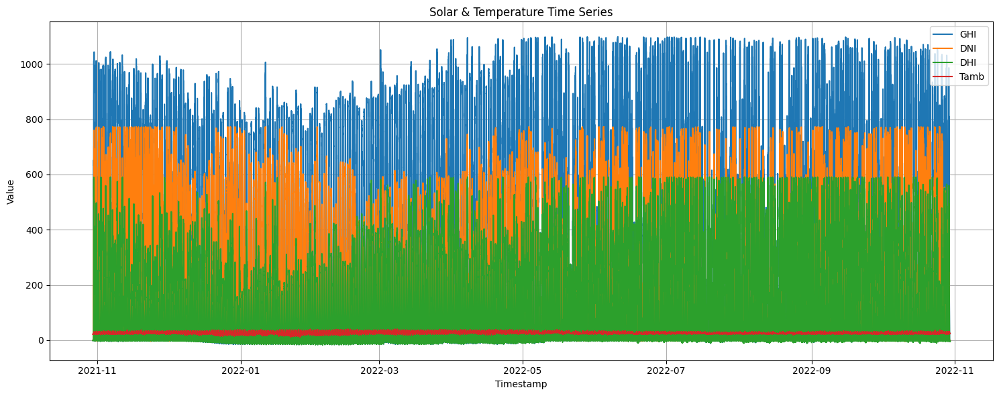

In [12]:
!pip install matplotlib
import matplotlib.pyplot as plt
import pandas as pd

# 1. Check Timestamp column
if df_clean['Timestamp'].isna().all():
    raise ValueError("All values in 'Timestamp' are NaT. Check your input data or datetime format.")

# 2. Drop rows where Timestamp is NaT (optional, if only some rows are invalid)
df_clean = df_clean.dropna(subset=['Timestamp'])

# 3. Convert and sort Timestamp
df_clean['Timestamp'] = pd.to_datetime(df_clean['Timestamp'], errors='coerce')
df_clean = df_clean.sort_values('Timestamp')

# 4. Plot Time Series of Solar & Temperature variables
plt.figure(figsize=(15, 6))
for col in ["GHI", "DNI", "DHI", "Tamb"]:
    if col in df_clean.columns:
        plt.plot(df_clean["Timestamp"], df_clean[col], label=col)

plt.legend()
plt.title("Solar & Temperature Time Series")
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Cleaning Impact

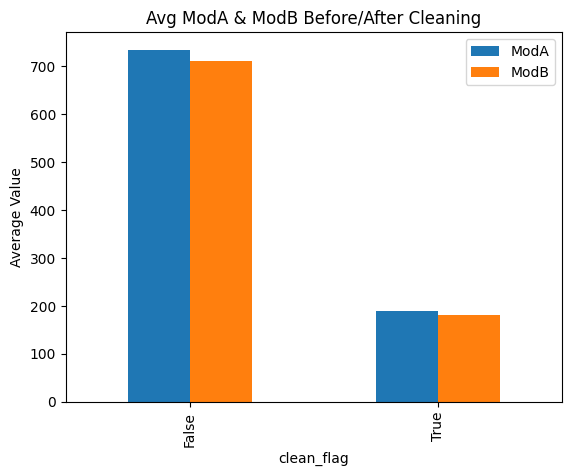

In [13]:
df["clean_flag"] = ~df['is_outlier']
df.groupby("clean_flag")[["ModA", "ModB"]].mean().plot(kind="bar", title="Avg ModA & ModB Before/After Cleaning")
plt.ylabel("Average Value")
plt.show()

In [ ]:
#Correlation & Relationship Analysis

In [15]:
!pip install seaborn


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Your plotting code here...


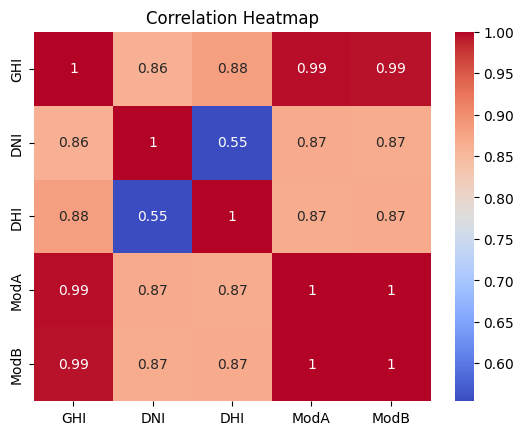

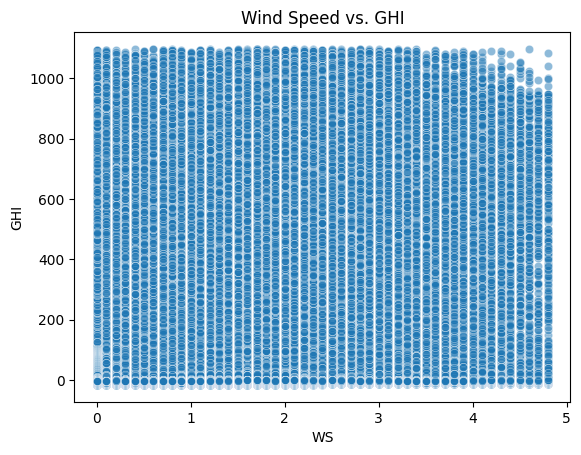

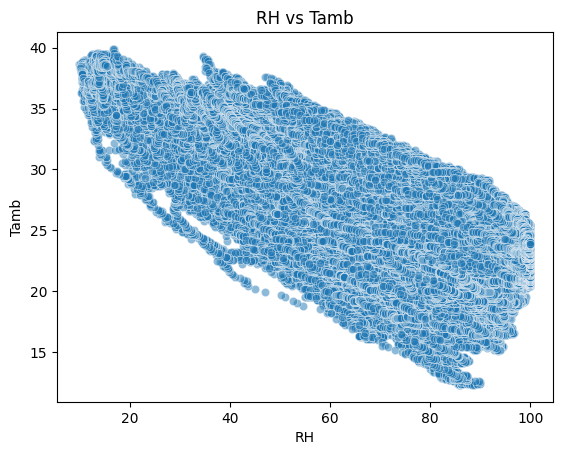

In [17]:
sns.heatmap(df_clean[["GHI", "DNI", "DHI", "ModA", "ModB"]].corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

sns.scatterplot(data=df_clean, x="WS", y="GHI", alpha=0.5)
plt.title("Wind Speed vs. GHI")
plt.show()

sns.scatterplot(data=df_clean, x="RH", y="Tamb", alpha=0.5)
plt.title("RH vs Tamb")
plt.show()

In [ ]:
 #8. Wind & Distribution Analysis

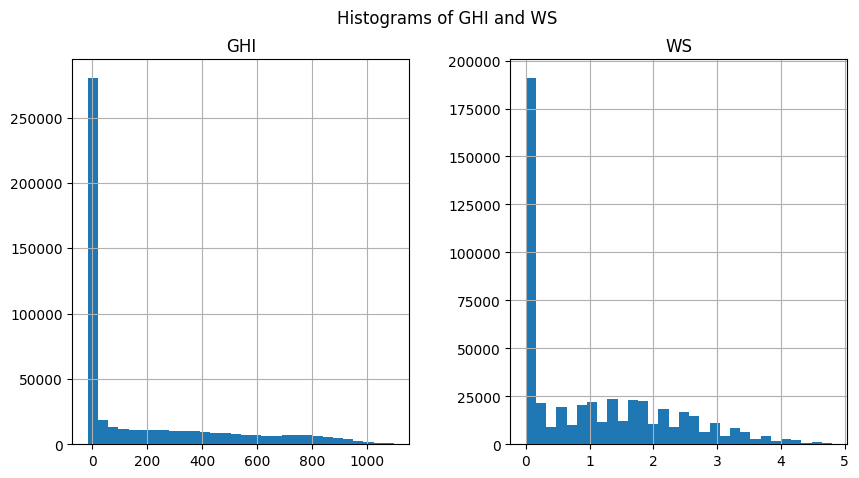

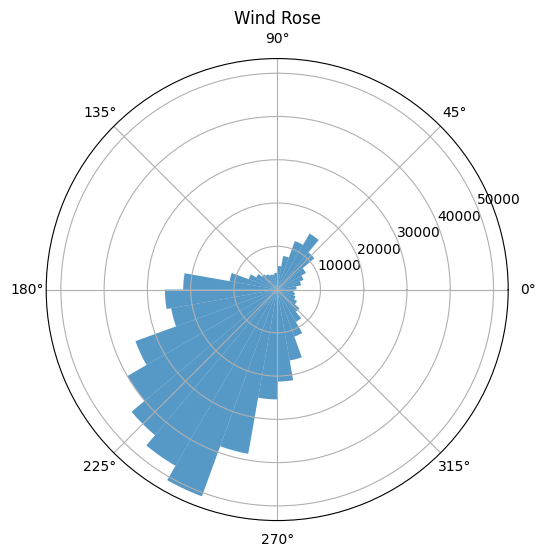

In [18]:
# Histogram
df_clean[["GHI", "WS"]].hist(bins=30, figsize=(10, 5))
plt.suptitle("Histograms of GHI and WS")
plt.show()

# Wind Rose (basic version using polar bar plot)
wind_df = df_clean[["WS", "WD"]].dropna()
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.hist(np.deg2rad(wind_df["WD"]), bins=36, weights=wind_df["WS"], alpha=0.75)
ax.set_title("Wind Rose")
plt.show()

In [ ]:
#Temperature Analysis & Bubble Chart!pip install plotly

In [19]:
!pip install plotly


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


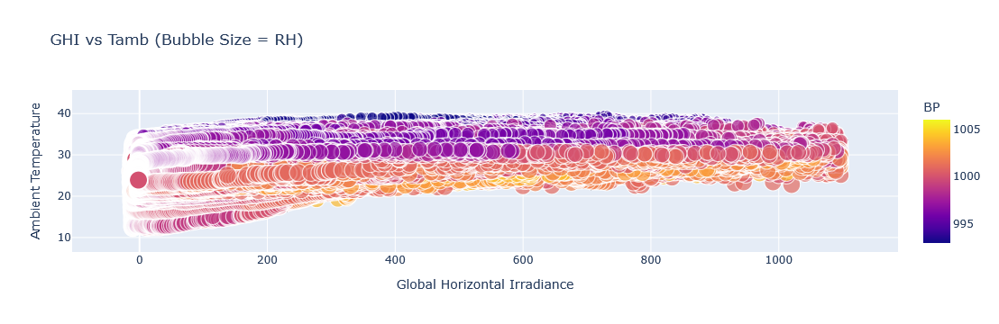

In [20]:
import plotly.express as px

fig = px.scatter(
    df_clean,  # <-- make sure this matches your actual cleaned DataFrame
    x="GHI",
    y="Tamb",
    size="RH",
    color="BP",
    title="GHI vs Tamb (Bubble Size = RH)",
    labels={"GHI": "Global Horizontal Irradiance", "Tamb": "Ambient Temperature"}
)

fig.show()